# Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## Goal 1:  First, I'll compute the camera calibration using chessboard images

### Import statements

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import cv2
import glob
import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [2]:
import moviepy
moviepy.__version__

'0.2.2.13'

### Exploring the data

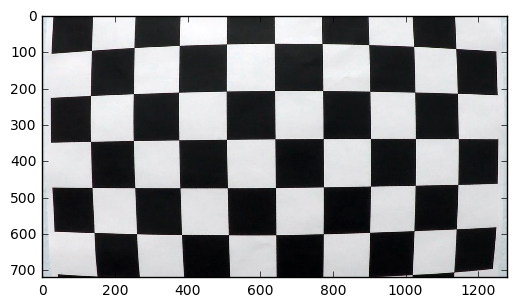

In [3]:
image = cv2.imread("camera_cal/calibration1.jpg")
plt.imshow(image)

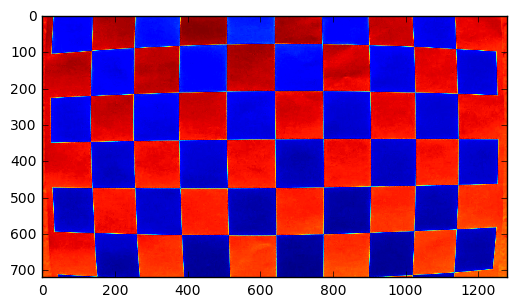

In [4]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image)

### Goal 1 & 2 : What we do
We compute corners of the chessboard image, compute corners of an idealized chessboard image (simply a grid) and obtain distortion coefficients (and a camera calibration matrix) by passing in these 2 sets of corresponding points between the actual and idealized 'image'. Then we apply it using the cv2.undistort function to an individual actual image to obtain and undistorted version. 

### Goal 1 & 2 : Computing 2 sets of corresponding points between an actual (distorted) and idealized image. 

In [5]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
#ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
        
#cv2.destroyAllWindows()

### Goal 1 & 2 : Computing the distortion coefficients and camera calibration matrix, using these to undistort an actual image. 

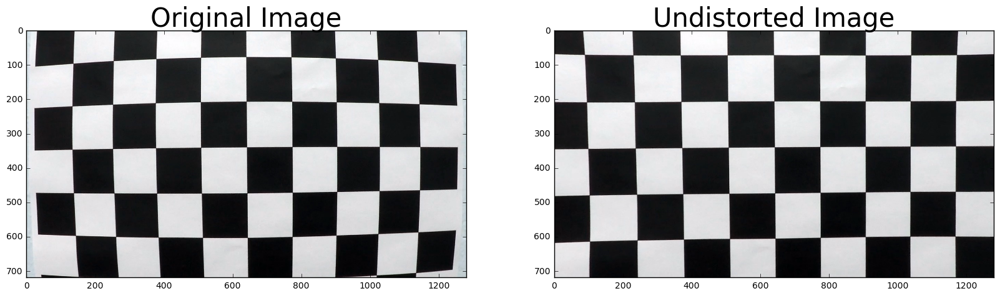

In [6]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# First, do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/distortion_coeffs_camera_mtx_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

### Goal 1 & 2 completed. 
## Goal 3 & 4 : Creating a pipeline for thresholding + perspective transform of an image.

In [7]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255), single_channel=False): # thresh = (20,100) good values
    thresh_min, thresh_max = thresh
    if not single_channel:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    if orient == 'x':
        gradients = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # finds sharp gradients wrt x-axis - i.e., vertical-ish lines. 
    elif orient == 'y':   
        gradients = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)# finds sharp gradients wrt y-axis - i.e., hortizontal-ish lines.
    abs_gradients = np.absolute(gradients)
    scaled_sobel = np.uint8(255*abs_gradients/np.max(abs_gradients))
    gradients_binary = np.zeros_like(scaled_sobel)
    gradients_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return gradients_binary


def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255), single_channel=False):
    if not single_channel:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img     
    gradients_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel) # finds sharp gradients wrt x-axis - i.e., vertical-ish lines. 
    gradients_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)# finds sharp gradients wrt y-axis - i.e., hortizontal-ish lines.
    abs_grad = np.sqrt(gradients_x**2 + gradients_y**2)
    scaled_sobel = np.uint8(255*abs_grad/np.max(abs_grad))
    mag_binary = np.zeros_like(scaled_sobel)
    thresh_min, thresh_max = mag_thresh
    mag_binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return mag_binary
   

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2), single_channel=False): # thresh =(0.7, 1.3) good values
    # Apply the following steps to img
    # 1) Convert to grayscale
    if not single_channel:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img
    # 2) Take the gradient in x and y separately
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_grad_x, abs_grad_y = np.absolute(grad_x), np.absolute(grad_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction_grad = np.arctan2(abs_grad_y, abs_grad_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction_grad)
    # 6) Return this mask as your binary_output image
    binary_output[(direction_grad >= thresh[0]) & (direction_grad <= thresh[1])] = 1
    return binary_output

def display_gradient_image(image, gradient_image, legend=""):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(gradient_image, cmap='gray')
    ax2.set_title('Output:'+ legend, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Different ways of Sobel thresholding

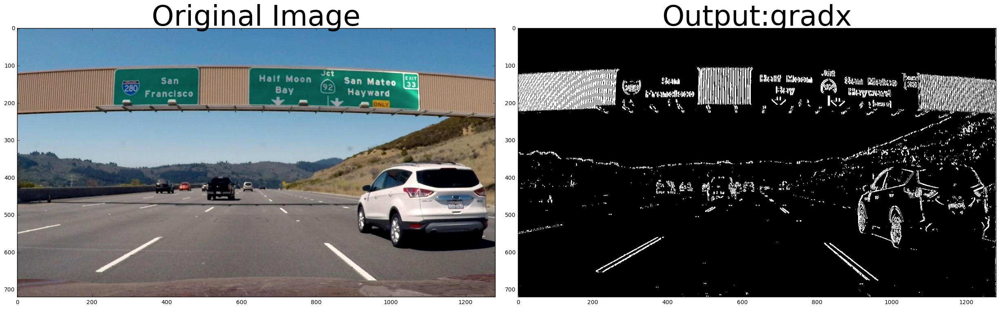

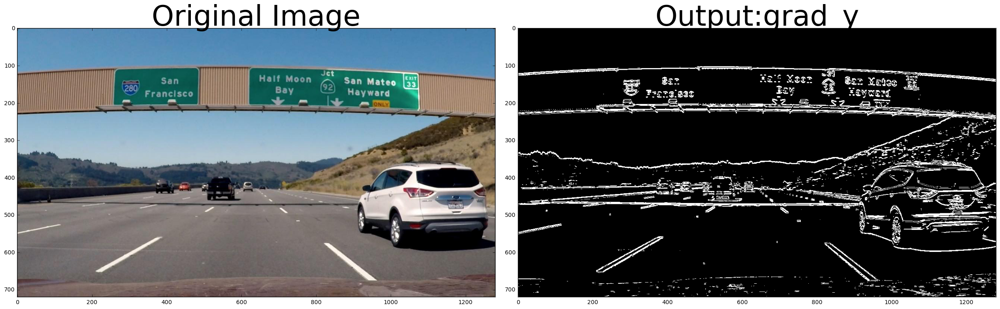

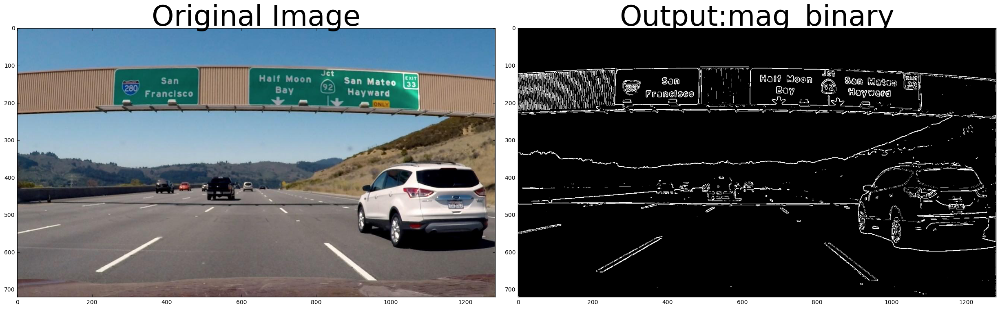

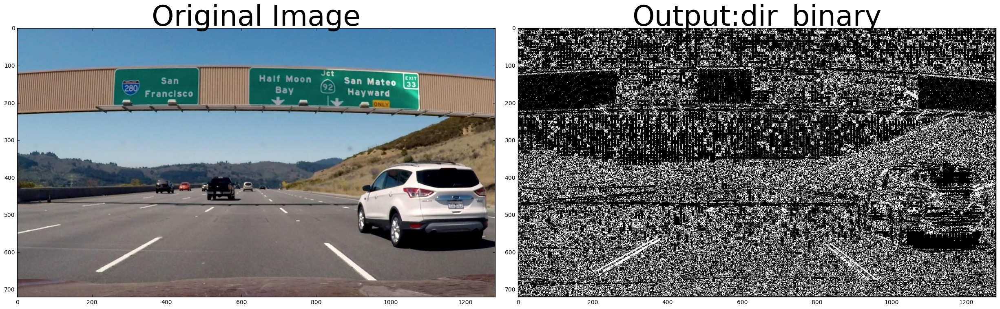

In [8]:
image = mpimg.imread("toy_examples/signs_vehicles_xygrad.png")

ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
display_gradient_image(image, gradx, "gradx")
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
display_gradient_image(image, grady, "grad_y")
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(50, 100))
display_gradient_image(image, mag_binary, "mag_binary")
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))
display_gradient_image(image, dir_binary, "dir_binary")

## Combined thresholded output example

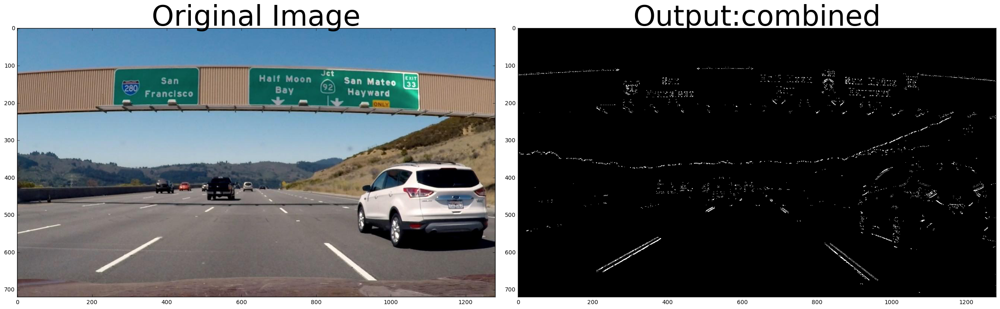

In [9]:
combined = np.zeros_like(dir_binary)
combined[((gradx == 1) ) & ((mag_binary == 1) & (dir_binary == 1))] = 1
display_gradient_image(image, combined, "combined")

In [10]:
def undistort(image):
    with open("camera_cal/distortion_coeffs_camera_mtx_pickle.p", mode='rb') as f:
        distortion_tbl = pickle.load(f)
        mtx = distortion_tbl["mtx"]
        dist = distortion_tbl["dist"]
        undist_image = cv2.undistort(image, mtx, dist, None, mtx)
        return undist_image
    
def threshold(img):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 35
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 160
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    #color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

    dir_binary = dir_threshold(image, sobel_kernel=3, thresh=(0.7, 1.3))
    combined = np.zeros_like(dir_binary)
     # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary
    
def perspective_xform(image):
    src = np.float32(
    [[585, 460],
     [203, 720],
     [1127, 720],
     [695, 460]])
    dst = np.float32(
    [[320,0],
     [320,720],
     [960,720],
     [960,0]])
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    return warped_img

In [11]:
def preprocess_image(image, DEBUG=False): # assume RGB image
    #undistort image
    undistorted_image = undistort(image)
    if DEBUG:
        display_gradient_image(image, undistorted_image, legend="Undistorted")
    # thresholding the image
    gradient_image = threshold(undistorted_image)
    if DEBUG:
        display_gradient_image(undistorted_image, gradient_image, legend="Thresholded")   
    # perspective_transform
    processed_image = perspective_xform(gradient_image)
    if DEBUG:
        display_gradient_image(gradient_image, processed_image, legend="Perspective xformed")
    return undistorted_image, processed_image
    

### Goals 3 & 4 achieved ; Testing the pipeline:

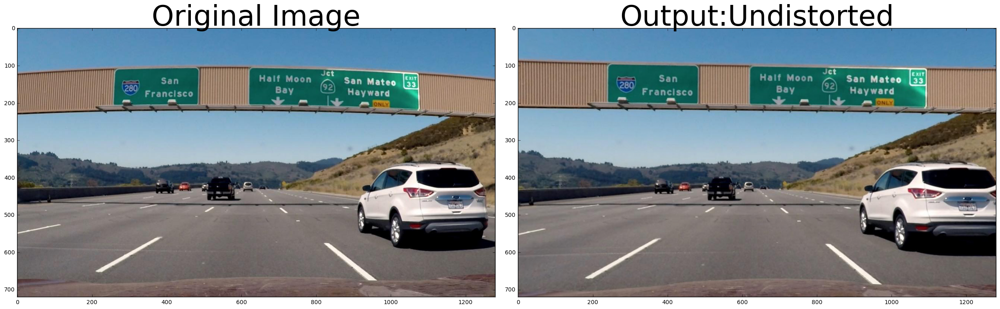

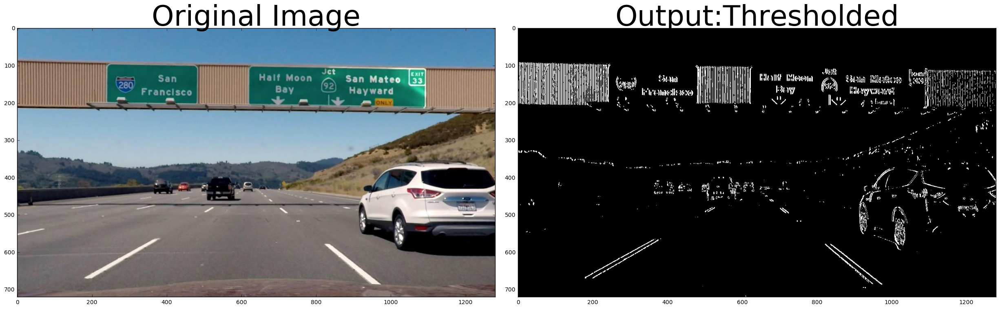

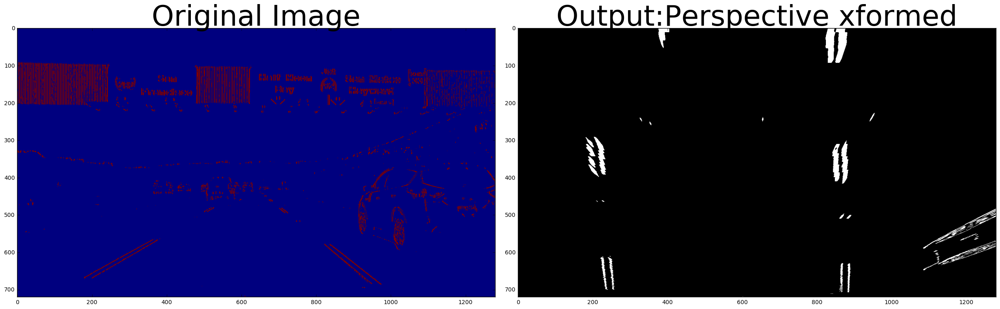

In [12]:
img = mpimg.imread("toy_examples/signs_vehicles_xygrad.png")
undistorted_image, processed_img = preprocess_image(img, DEBUG=True)

## Goal 5: Finding Lane lines on an image.

In [13]:
def find_lines_v1(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    #plt.imshow(out_img)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.xlim(0, 1280)
    #plt.ylim(720, 0)
    return left_fit, right_fit, left_fitx, right_fitx, ploty, lefty, leftx, righty, rightx

In [14]:
def get_curvature_v1(left_fit, right_fit, ploty):
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)/2.
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    curvature = (left_curverad + right_curverad) / 2.
    return curvature


In [15]:
def get_curvature_v2(lefty, leftx, righty, rightx, ploty):
    y_eval = np.max(ploty)/2.
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Conversion
    lefty, leftx, righty, rightx =lefty.astype(np.float64),leftx.astype(np.float64),righty.astype(np.float64),rightx.astype(np.float64) 
    lefty *= ym_per_pix
    leftx *= xm_per_pix
    righty *= ym_per_pix
    rightx *= xm_per_pix
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # fitting polynomial for new vals
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    #
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    curvature = (left_curverad + right_curverad) / 2.
    return curvature

In [16]:
left_fit, right_fit, left_fitx, right_fitx, ploty, lefty, leftx, righty, rightx = find_lines_v1(processed_img)

In [17]:
def eval_polynomial(x, coeffs): # evals 2nd order polynomial
    return coeffs[0]*x**2 + coeffs[1]*x + coeffs[2]

In [18]:
curvature = get_curvature_v2(lefty, leftx, righty, rightx, ploty)
print(curvature)

6084.45695492


## Goal 7 : Warp the detected lane boundaries back onto the original image , and
## Goal 8: Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

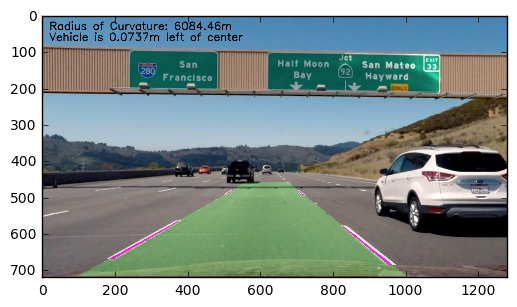

In [19]:
def get_minv():
    src = np.float32(
    [[585, 460],
     [203, 720],
     [1127, 720],
     [695, 460]])
    dst = np.float32(
    [[320,0],
     [320,720],
     [960,720],
     [960,0]])
    Minv = cv2.getPerspectiveTransform(dst, src)
    return Minv

def warp_lane_lines(undistorted_image, processed_img, left_fit, right_fit, left_fitx, right_fitx, ploty, curvature):
    warped = processed_img
    Minv = get_minv()
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    undistorted_image = undistorted_image.astype(np.float32)
    newwarp = (cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))).astype(np.float32)
    # Combine the result with the original image
    #if type(undistorted_image) != type(newwarp) or undistorted_image.shape != newwarp.shape:
    #print("Error: shape and types : " , undistorted_image.shape, undistorted_image.dtype, newwarp.shape, newwarp.dtype )
    result = cv2.addWeighted(undistorted_image, 1, newwarp, 0.3, 0)
    
    # computing center
    center = (1.5 * eval_polynomial(image.shape[0], left_fit)
              - eval_polynomial(image.shape[0], right_fit)) / 2.
    center = center / 12800. * 3.7
    #curvature = curvature / 128 * 3.7
    cv2.putText(result,'Radius of Curvature: %.2fm' % curvature,(20,40), cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    left_or_right = "left" if center < 0 else "right"
    cv2.putText(result, 'Vehicle is %.4fm %s of center' % (np.abs(center), left_or_right), (20, 70), cv2.FONT_HERSHEY_SIMPLEX, 
                1,(255, 255, 255), 2)
    return result

result = warp_lane_lines(undistorted_image, processed_img, left_fit, right_fit, left_fitx, right_fitx, ploty, curvature)  
plt.imshow(result)

### Goal 7 & 8 completed. 

## Pipeline for video

In [20]:
# result from img_pipeline
result_old = None
ctr1 = 0 # how many frames were not replaced (to be used as a baseline)
ctr2 = 0 # how many frames were replaced
rets = [] # array of matchShapes() values, so we can help establish a threshold. Check histogram below. 

In [21]:
def img_pipeline(img):
    global result_old
    global ctr1
    global ctr2
    global rets
    undistorted_image, processed_img = preprocess_image(img)
    #print("preprocess done!")
    left_fit, right_fit, left_fitx, right_fitx, ploty, lefty, leftx, righty, rightx = find_lines_v1(processed_img)
    #print("find lines v1 done!")
    curvature = get_curvature_v2(lefty, leftx, righty, rightx, ploty)
    #print("get curvature v1 done!")
    result = warp_lane_lines(undistorted_image, processed_img, left_fit, right_fit, left_fitx, right_fitx, ploty, curvature)
    #print ("warp lane lines done!")
    if (result_old == None):
        result_old = result
    gray_old, gray = cv2.cvtColor(result_old, cv2.COLOR_BGR2GRAY), cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)    
    ret = cv2.matchShapes(gray_old,gray,1,0.0) # matchShapes takes in only 1-channel images. 
    rets.append(ret)
    if (ret < 0.0009):
    # Use the new polygon points to write the next frame due to similarities of last successfully written polygon area
        result_old = result
        ctr1 += 1
    else:
        result = result_old
        ctr2 += 1
    return result
    

In [22]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
output = 'output_project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(img_pipeline) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video output_project_video.mp4
[MoviePy] Writing video output_project_video.mp4


100%|█████████▉| 1260/1261 [05:54<00:00,  3.94it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_project_video.mp4 

CPU times: user 5min 25s, sys: 1min 23s, total: 6min 48s
Wall time: 5min 55s


In [23]:
print(ctr1, ctr2)

1194 67


### 67 frames were replaced using the result_old method. The histogram below helped establish the threshold value for cv2.matchShapes. 

In [96]:
np.histogram(rets)

(array([1105,   88,   34,   22,    5,    0,    1,    2,    1,    3]),
 array([ 0.        ,  0.00024673,  0.00049346,  0.00074019,  0.00098692,
         0.00123366,  0.00148039,  0.00172712,  0.00197385,  0.00222058,
         0.00246731]))

In [24]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))